In [1]:
%reload_ext autoreload
%autoreload 2

In [2]:
from PDESolver import *

# 2D tests

## 2D stationnary equation with psiOp()


*********************************
* Partial differential equation *
*********************************

     ⎛ 2    2             ⎞                 
psiOp⎝η  + ξ  + 1, u(x, y)⎠ = -sin(x)⋅sin(y)

********************
* Equation parsing *
********************


Equation rewritten in standard form: sin(x)*sin(y) + psiOp(eta**2 + xi**2 + 1, u(x, y))
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: sin(x)*sin(y) + psiOp(eta**2 + xi**2 + 1, u(x, y))
Analyzing term: sin(x)*sin(y)
  --> Classified as source term
Analyzing term: psiOp(eta**2 + xi**2 + 1, u(x, y))
  --> Classified as pseudo linear term (psiOp)
Final linear terms: {}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: [(1, eta**2 + xi**2 + 1)]
Source terms: [sin(x)*sin(y)]
⚠️  Pseudo‑differential operator detected: all other linear terms have been rejected.

symbol = 
 2    2    
η  + ξ  + 1
⚠️ For psiOp, use interactive_symbol_analysis.

symbol = 
 2    2    
η  + ξ  + 1
✅ Elliptic pseudo-differential sy

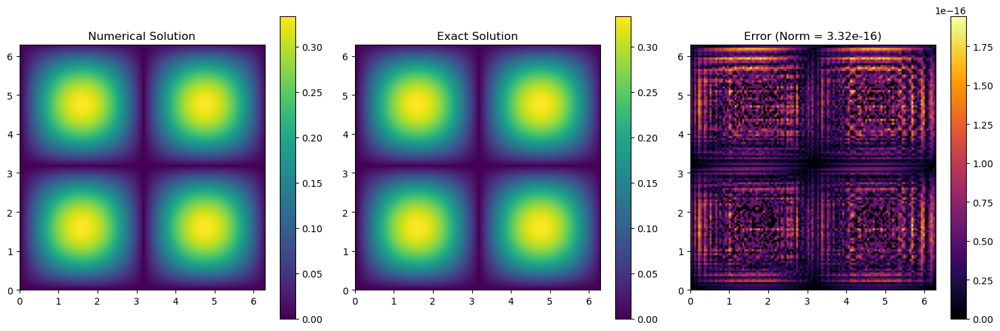

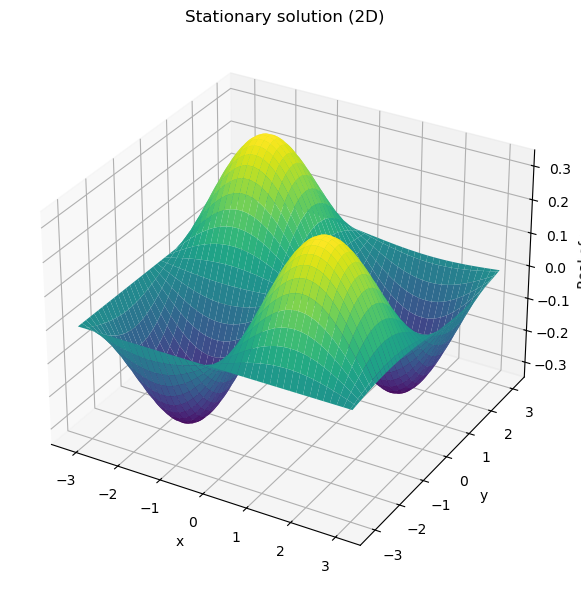

In [3]:
# Symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)
u = Function('u')(x, y)

# Symbolic equation
symbol = xi**2 + eta**2 + 1
equation = Eq(psiOp(symbol, u), -sin(x) * sin(y))

# Define exact solution
def u_exact(x, y):
    return -np.sin(x) * np.sin(y) / 3

# Solver creation
solver = PDESolver(equation)

# Domain
Lx, Ly = 2 * np.pi, 2 * np.pi
Nx, Ny = 128, 128

# Setup with exact solution as source
solver.setup(Lx=Lx, Ly=Ly, Nx=Nx, Ny=Ny, initial_condition=None)

# Stationary solution
u_num = solver.solve_stationary_psiOp()

# Accuracy test
solver.test(u_exact=u_exact, threshold=20, component='real')

solver.show_stationary_solution(u=u_num, component='real')

## 2D stationnary equation with psiOp() depending on spatial variables


*********************************
* Partial differential equation *
*********************************

                                                                2    2
     ⎛ 2    2    2    2             ⎞   ⎛     2      2    ⎞  - x  - y 
psiOp⎝η  + x  + ξ  + y  + 1, u(x, y)⎠ = ⎝- 3⋅x  - 3⋅y  + 5⎠⋅ℯ         

********************
* Equation parsing *
********************


Equation rewritten in standard form: -(-3*x**2 - 3*y**2 + 5)*exp(-x**2 - y**2) + psiOp(eta**2 + x**2 + xi**2 + y**2 + 1, u(x, y))
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: -(-3*x**2 - 3*y**2 + 5)*exp(-x**2 - y**2) + psiOp(eta**2 + x**2 + xi**2 + y**2 + 1, u(x, y))
Analyzing term: -(-3*x**2 - 3*y**2 + 5)*exp(-x**2 - y**2)
  --> Classified as source term
Analyzing term: psiOp(eta**2 + x**2 + xi**2 + y**2 + 1, u(x, y))
  --> Classified as pseudo linear term (psiOp)
Final linear terms: {}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: [(1, eta**2 + x**2 + xi**2 + y**2 + 1)]
Sou

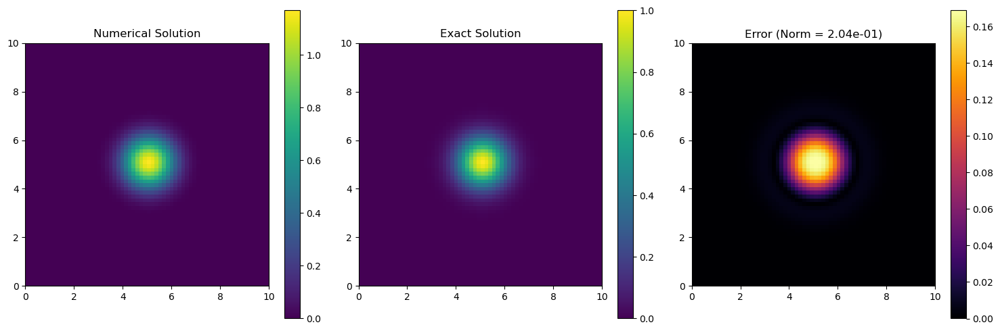

In [4]:
import numpy as np
from sympy import symbols, Function, exp, Eq, diff

# 1) Define symbolic variables
x, y, xi, eta = symbols('x y xi eta', real=True)
u = Function('u')(x, y)

# 2) Define the 2D symbol p(x, y, xi, eta)
p_symbol = xi**2 + eta**2 + x**2 + y**2 + 1

# 3) Choose an exact solution u_exact(x, y)
u_exact_expr = exp(-x**2 - y**2)

def u_exact(x, y):
    return np.exp(-x**2 - y**2)

# 4) Compute the right-hand side f_expr = P[u_exact] symbolically
f_expr = (-3*x**2 - 3*y**2 + 5)*u_exact_expr

# 5) Build the stationary equation: psiOp(p_symbol, u) = f_expr
equation_2d = Eq(psiOp(p_symbol, u), f_expr)

# 6) Initialize and setup the solver
solver2d = PDESolver(equation_2d)
solver2d.setup(Lx=10.0, Ly=10.0, Nx=64, Ny=64, initial_condition=None)

# 7) Solve stationary psiOp problem (first-order asymptotic inverse)
u_num2d = solver2d.solve_stationary_psiOp(order=1)

# 8) Test numerical vs exact
solver2d.test(u_exact=u_exact, threshold=3e-1, component='real')


## 2D transport equation


*********************************
* Partial differential equation *
*********************************

∂                  ∂                ∂             
──(u(t, x, y)) = - ──(u(t, x, y)) - ──(u(t, x, y))
∂t                 ∂x               ∂y            

********************
* Equation parsing *
********************


Equation rewritten in standard form: Derivative(u(t, x, y), t) + Derivative(u(t, x, y), x) + Derivative(u(t, x, y), y)

Expanded equation: Derivative(u(t, x, y), t) + Derivative(u(t, x, y), x) + Derivative(u(t, x, y), y)
Analyzing term: Derivative(u(t, x, y), t)
  Derivative found: Derivative(u(t, x, y), t)
  --> Classified as linear
Analyzing term: Derivative(u(t, x, y), x)
  Derivative found: Derivative(u(t, x, y), x)
  --> Classified as linear
Analyzing term: Derivative(u(t, x, y), y)
  Derivative found: Derivative(u(t, x, y), y)
  --> Classified as linear
Final linear terms: {Derivative(u(t, x, y), t): 1, Derivative(u(t, x, y), x): 1, Derivative(u(t, x, y), y): 1}


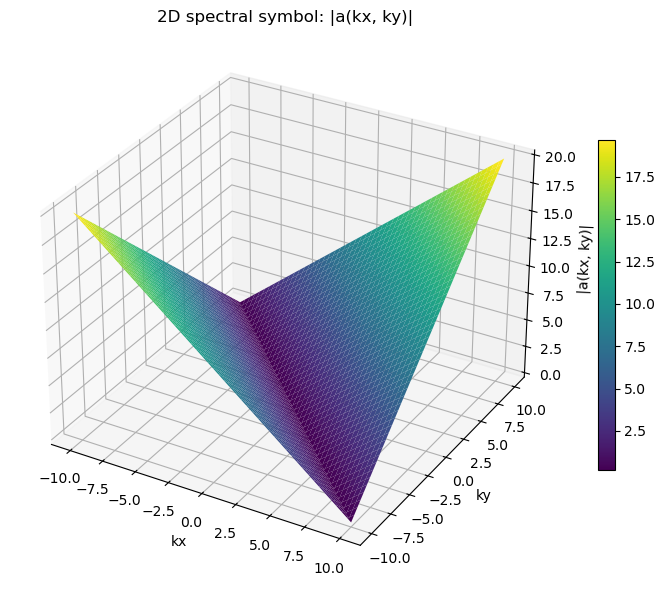


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 1.166e-12


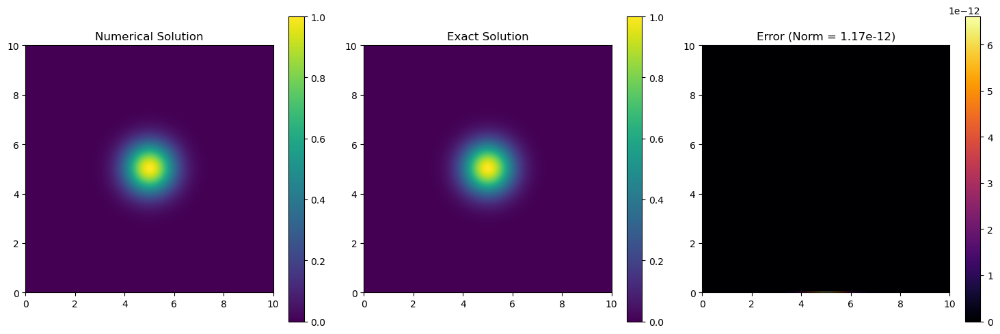

Closest available time to t_eval=0.75: 0.75
Test error t = 0.75: 4.030e-02


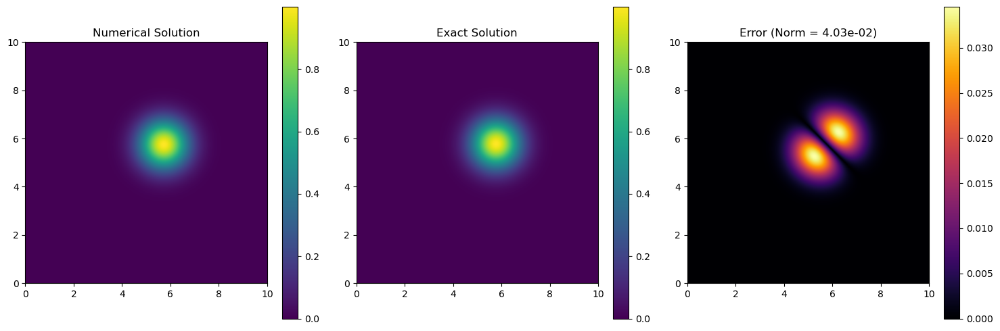

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 4.030e-02


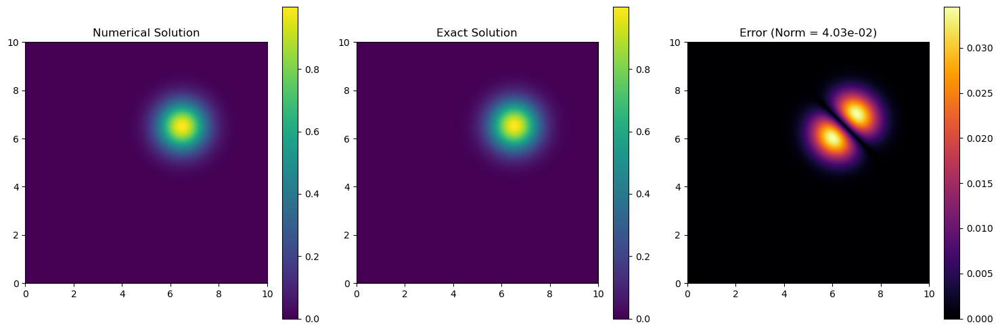

Closest available time to t_eval=2.25: 2.25
Test error t = 2.25: 4.030e-02


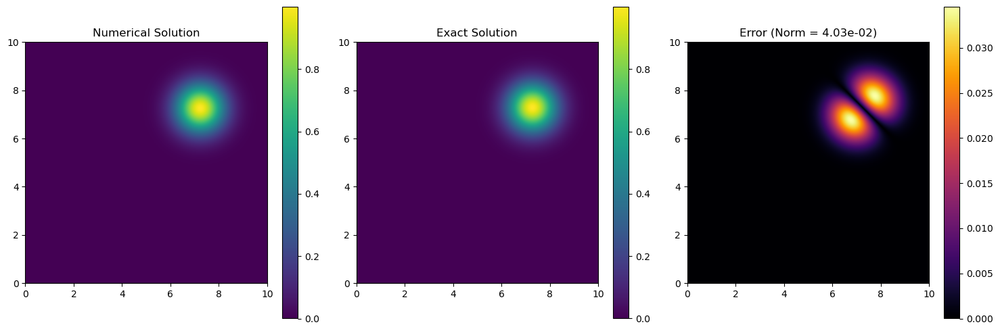

Closest available time to t_eval=3.0: 3.0
Test error t = 3.0: 4.029e-02


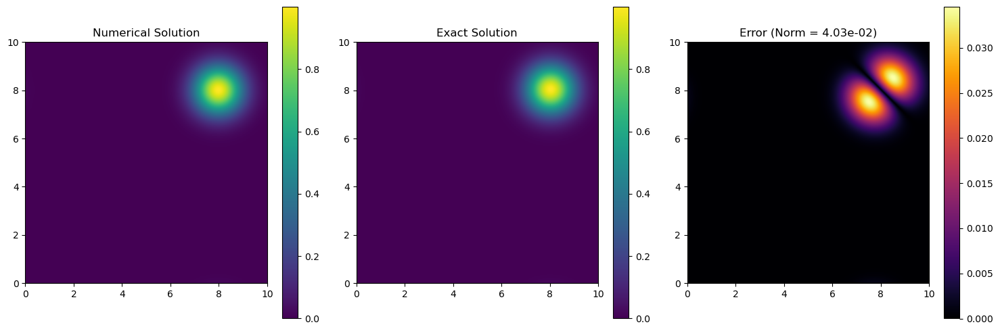

In [5]:
# Definition of the 2D transport equation
t, x, y, kx, ky, omega = symbols('t x y kx ky omega')
u_func = Function('u') 
u = u_func(t, x, y)

transport_eq = Eq(diff(u, t), -diff(u, x) - diff(u, y))  # Diagonal transport

# Creation of the solver with periodic conditions
solver = PDESolver(transport_eq)

# Configuration of the 2D domain and initial condition
L = 10.0  # Square domain [-5, 5] × [-5, 5]
N = 512   # Spatial resolution
Lt=3.0
solver.setup(
    Lx=L, Ly=L,
    Nx=N, Ny=N,
    Lt=Lt, Nt=2000,
    initial_condition=lambda x, y: np.exp(-(x**2 + y**2))  # 2D Gaussian
)

# Exact solution with periodic wrapping
def u_exact(x, y, t):
    Lx = Ly = L  # Square domain
    x_shift = (x - t + Lx/2) % Lx - Lx/2  # Periodic wrapping in x
    y_shift = (y - t + Ly/2) % Ly - Ly/2  # Periodic wrapping in y
    return np.exp(-(x_shift**2 + y_shift**2))

# Solving and validation
solver.solve()

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5e-2, component='real') for i in range(n_test + 1)]

## 2D heat equation


*********************************
* Partial differential equation *
*********************************

                  2                 2             
∂                ∂                 ∂              
──(u(t, x, y)) = ───(u(t, x, y)) + ───(u(t, x, y))
∂t                 2                 2            
                 ∂x                ∂y             

********************
* Equation parsing *
********************


Equation rewritten in standard form: Derivative(u(t, x, y), t) - Derivative(u(t, x, y), (x, 2)) - Derivative(u(t, x, y), (y, 2))

Expanded equation: Derivative(u(t, x, y), t) - Derivative(u(t, x, y), (x, 2)) - Derivative(u(t, x, y), (y, 2))
Analyzing term: Derivative(u(t, x, y), t)
  Derivative found: Derivative(u(t, x, y), t)
  --> Classified as linear
Analyzing term: -Derivative(u(t, x, y), (x, 2))
  Derivative found: Derivative(u(t, x, y), (x, 2))
  --> Classified as linear
Analyzing term: -Derivative(u(t, x, y), (y, 2))
  Derivative found: Derivative(u(t, x, y), (y

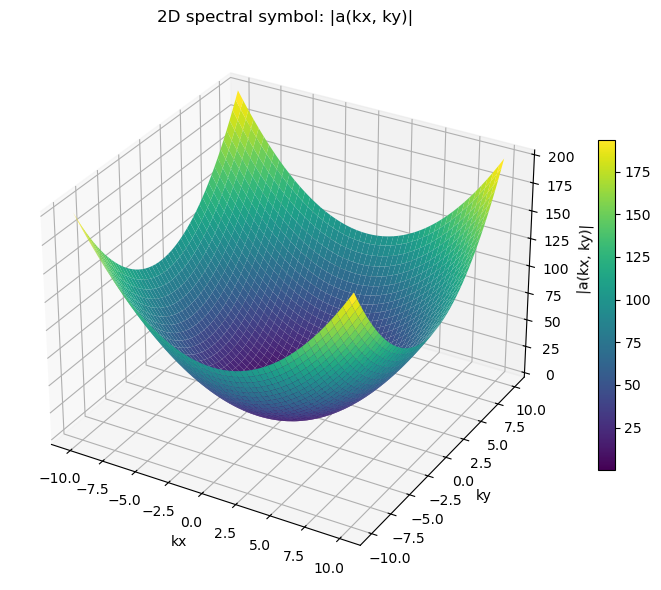


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 3.068e-03


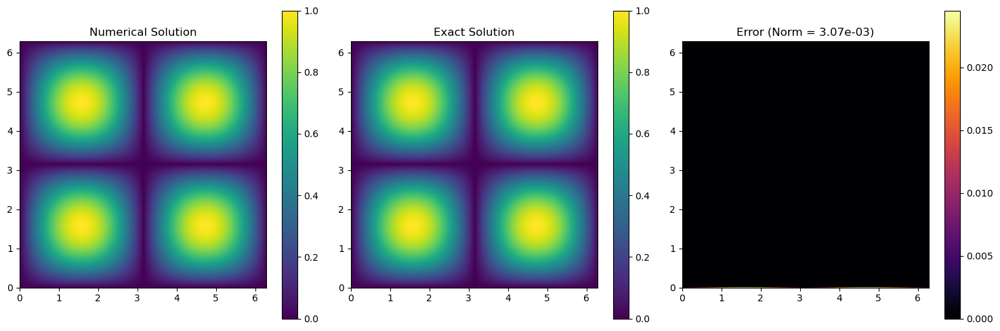

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 3.068e-03


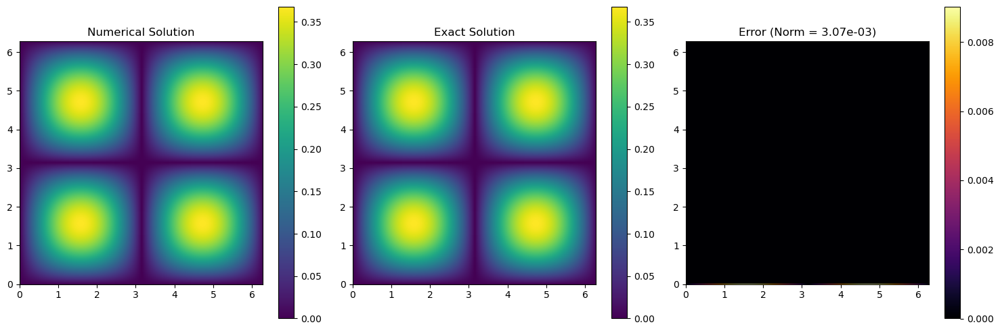

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 3.069e-03


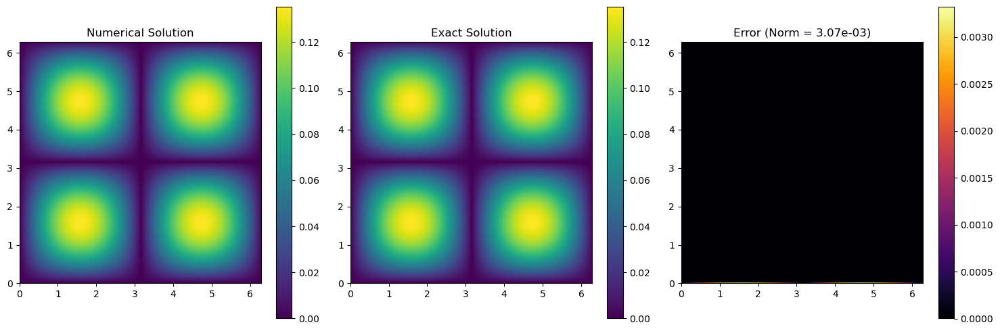

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 3.072e-03


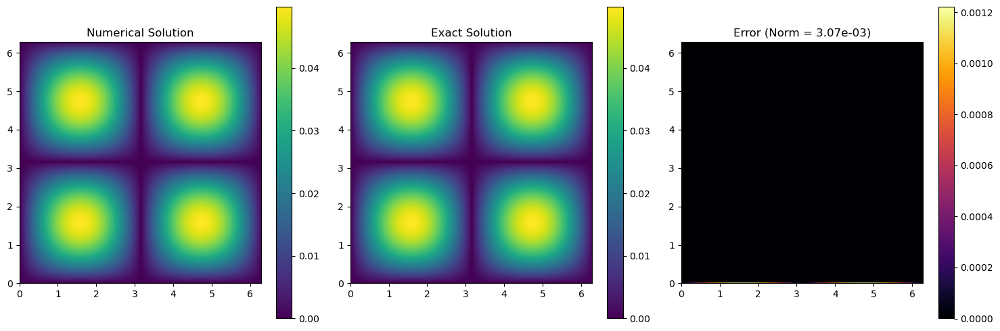

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 3.076e-03


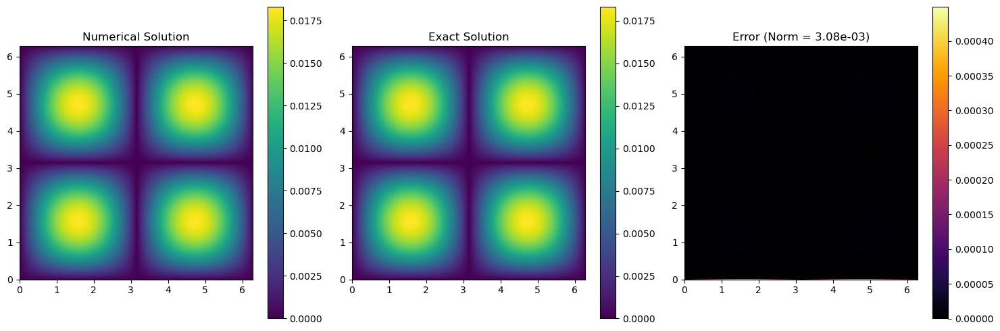

In [6]:
# Define the symbols and the unknown function
t, x, y, kx, ky, omega = symbols('t x y kx ky omega')
u_func = Function('u') 
u = u_func(t, x, y)

# Define the 2D heat equation
eq = Eq(diff(u, t), diff(u, x, x) + diff(u, y, y))

# Initialize the solver
solver = PDESolver(eq)
Lt=2.0
# Configure the solver with the problem parameters
solver.setup(
    Lx=2 * np.pi, Ly=2 * np.pi,  # Spatial domain: [0, 2π] × [0, 2π]
    Nx=512, Ny=512,             # Spatial resolution: 512×512 points
    Lt=Lt, Nt=100,             # Total time: 1.0, number of time steps: 100
    initial_condition=lambda x, y: np.sin(x) * np.sin(y),  # Initial condition
)

# Solve the equation
solver.solve()

# Exact solution at t = 1
def u_exact(x, y, t):
    """
    Analytical solution of the 2D Poisson equation.
    The solution is given by u(x, y, t) = sin(x) * sin(y) * exp(-2t).
    """
    return np.sin(x) * np.sin(y) * np.exp(-2.0 * t)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5e-2, component='real') for i in range(n_test + 1)]

## 2D heat equation with psiOp


*********************************
* Partial differential equation *
*********************************

∂                     ⎛   2    2            ⎞
──(u(t, x, y)) = psiOp⎝- η  - ξ , u(t, x, y)⎠
∂t                                           

********************
* Equation parsing *
********************


Equation rewritten in standard form: -psiOp(-eta**2 - xi**2, u(t, x, y)) + Derivative(u(t, x, y), t)
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: -psiOp(-eta**2 - xi**2, u(t, x, y)) + Derivative(u(t, x, y), t)
Analyzing term: -psiOp(-eta**2 - xi**2, u(t, x, y))
  --> Classified as pseudo linear term (psiOp)
Analyzing term: Derivative(u(t, x, y), t)
  Derivative found: Derivative(u(t, x, y), t)
  --> Classified as linear
Final linear terms: {Derivative(u(t, x, y), t): 1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: [(-1, -eta**2 - xi**2)]
Source terms: []
⚠️  Pseudo‑differential operator detected: all other linear terms have been rejected.

********

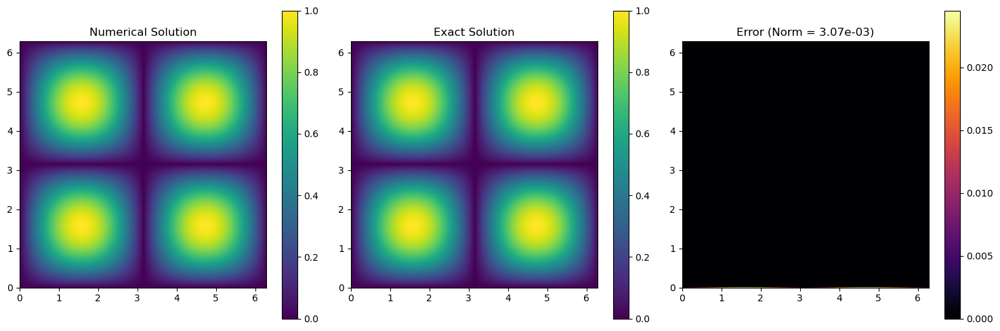

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 3.068e-03


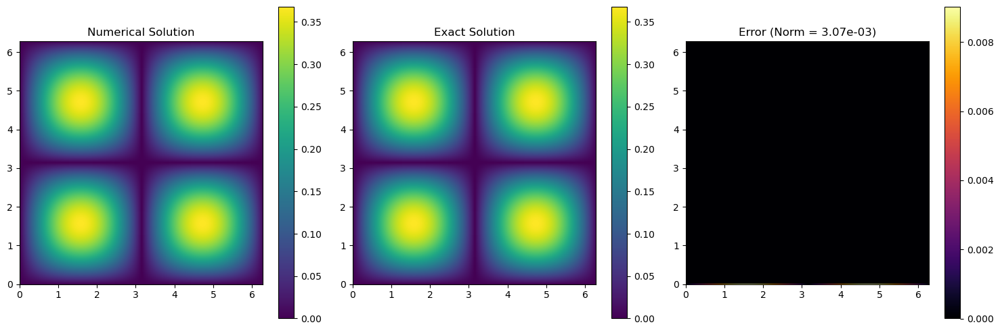

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 3.069e-03


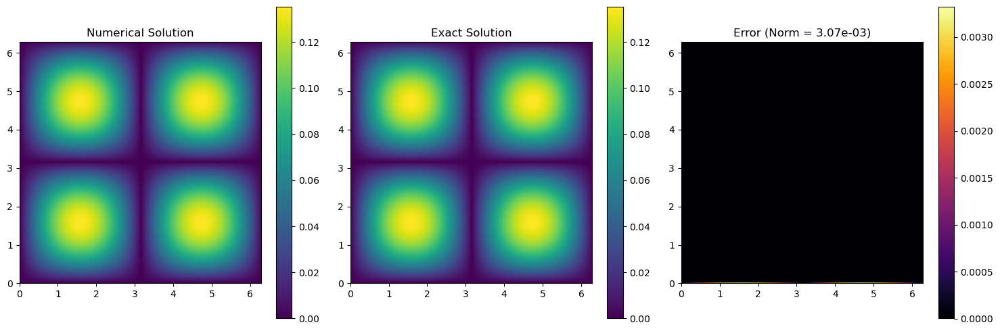

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 3.072e-03


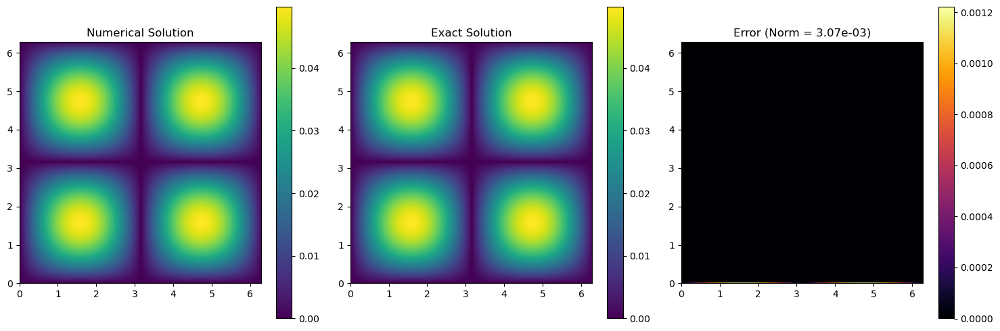

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 3.076e-03


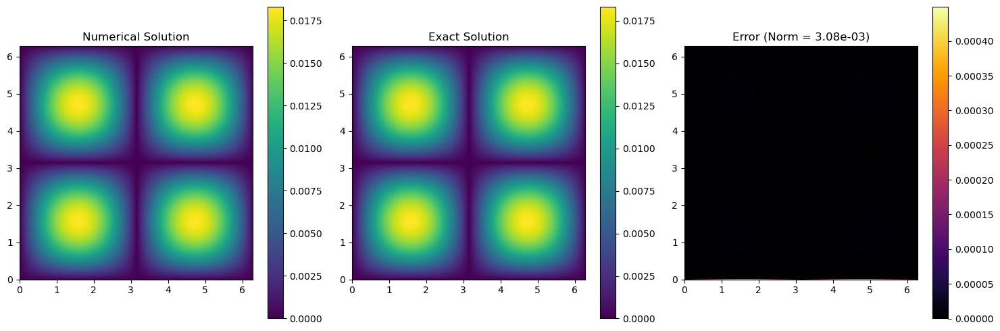

In [7]:
# Define the symbols and the unknown function
from sympy import symbols, Eq, Function
from numpy import sin, exp
import numpy as np

# Define symbols
t, x, y, xi, eta = symbols('t x y xi eta', real=True)
u_func = Function('u')
u = u_func(t, x, y)

# Define the equation using psiOp
eq = Eq(diff(u, t), psiOp(-(xi**2 + eta**2), u))

# Create the solver instance
solver = PDESolver(eq)

# Total simulation time
Lt = 2.0

# Setup the solver
solver.setup(
    Lx=2 * np.pi, Ly=2 * np.pi,
    Nx=512, Ny=512,
    Lt=Lt, Nt=100,
    initial_condition=lambda x, y: np.sin(x) * np.sin(y)
)

# Solve the PDE
solver.solve()

# Define the exact solution
def u_exact(x, y, t):
    return np.sin(x) * np.sin(y) * np.exp(-2.0 * t)

# Test the result
n_test = 4
test_set = [
    solver.test(
        u_exact=u_exact,
        t_eval=i * Lt / n_test,
        threshold=5e-2,
        component='real'
    )
    for i in range(n_test + 1)
]


## 2D Schrödinger equation


*********************************
* Partial differential equation *
*********************************

                    2                 2             
  ∂                ∂                 ∂              
ⅈ⋅──(u(t, x, y)) = ───(u(t, x, y)) + ───(u(t, x, y))
  ∂t                 2                 2            
                   ∂x                ∂y             

********************
* Equation parsing *
********************


Equation rewritten in standard form: I*Derivative(u(t, x, y), t) - Derivative(u(t, x, y), (x, 2)) - Derivative(u(t, x, y), (y, 2))

Expanded equation: I*Derivative(u(t, x, y), t) - Derivative(u(t, x, y), (x, 2)) - Derivative(u(t, x, y), (y, 2))
Analyzing term: I*Derivative(u(t, x, y), t)
  Derivative found: Derivative(u(t, x, y), t)
  --> Classified as linear
Analyzing term: -Derivative(u(t, x, y), (x, 2))
  Derivative found: Derivative(u(t, x, y), (x, 2))
  --> Classified as linear
Analyzing term: -Derivative(u(t, x, y), (y, 2))
  Derivative found: Derivativ

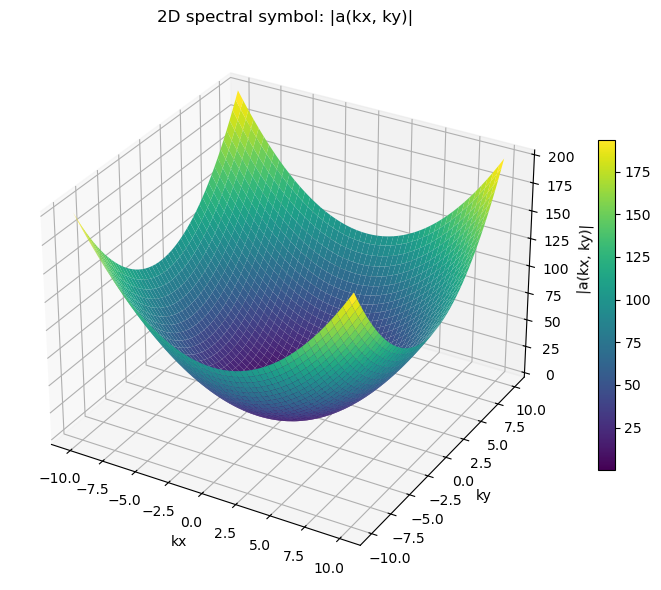


*******************
* Solving the PDE *
*******************



/home/fifi/pdesolver_prod/PDESolver.py:3437: RuntimeWarning: invalid value encountered in divide
  return np.where(np.abs(z) > 1e-12, (np.exp(z) - 1) / z, 1.0)
/home/fifi/pdesolver_prod/PDESolver.py:3440: RuntimeWarning: invalid value encountered in divide
  return np.where(np.abs(z) > 1e-12, (np.exp(z) - 1 - z) / z**2, 0.5)


Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 3.475e-44


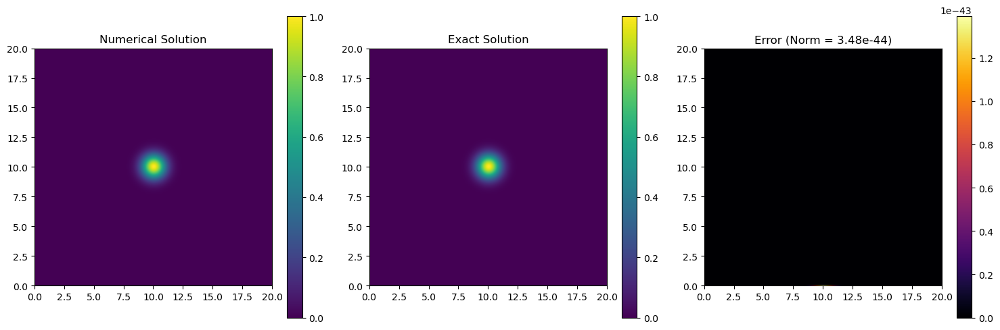

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 3.298e-02


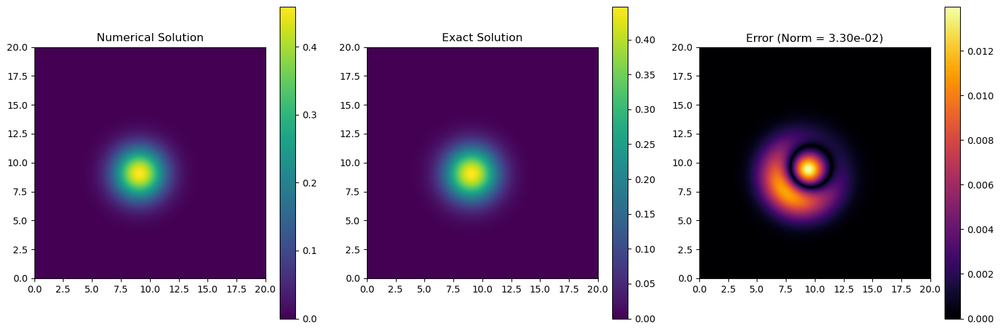

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 2.034e-02


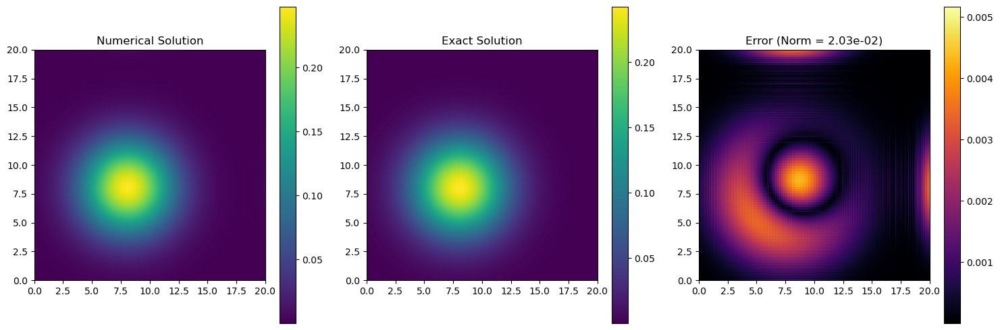

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 1.178e-01


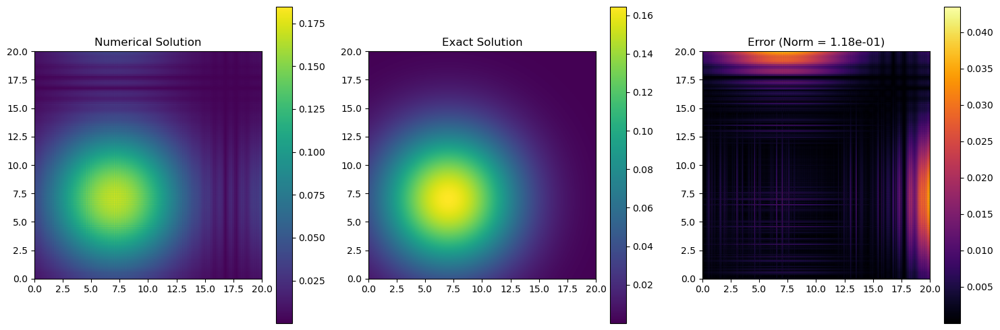

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 2.743e-01


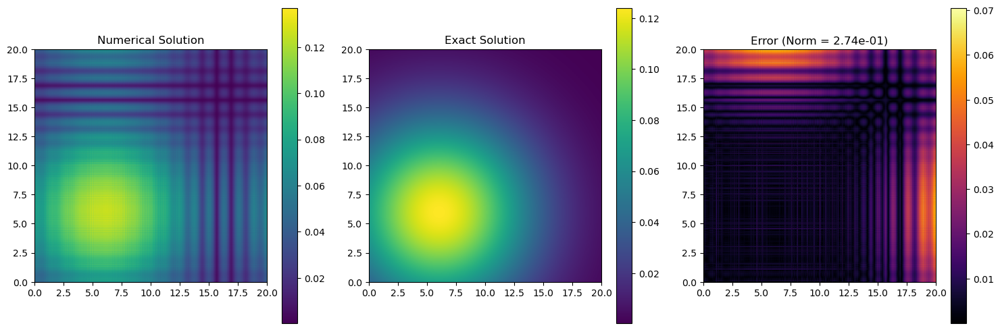

In [8]:
# Define the symbols and the unknown function
t, x, y, kx, ky, omega = symbols('t x y kx ky omega')
u_func = Function('u') 
u = u_func(t, x, y)

# 2D Schrödinger equation: i ∂t u = ∂xx u + ∂yy u
eq = Eq(I * diff(u, t), (diff(u, x, x) + diff(u, y, y)))

# Create the solver
solver = PDESolver(eq, time_scheme='ETD-RK4', dealiasing_ratio=1)

# Domain
Lx = Ly = 20
Nx = Ny = 512
Lt = 2.0
Nt = 500

# Initial condition: Gaussian wave packet modulated e^{-x^2 - y^2} e^{i(x + y)}
solver.setup(
    Lx=Lx, Ly=Ly, Nx=Nx, Ny=Ny, Lt=Lt, Nt=Nt,
    initial_condition=lambda x, y: np.exp(-x**2 - y**2) * np.exp(1j * (x + y))
)

# Solve the equation
solver.solve()

# Exact solution
def u_exact(x, y, t):
    """
    Analytical solution of the 2D Schrödinger equation.
    The solution is given by:
        u(x, y, t) = 1 / sqrt(1 + 4j * t)**2 * exp(i * (x + y - 2 * t)) * exp(-((x + 2t)^2 + (y + 2t)^2) / (1 + 4j * t)).
    """
    return 1 / np.sqrt(1 + 4j * t)**2 * np.exp(1j * (x + y - 2 * t)) * np.exp(-((x + 2 * t)**2 + (y + 2 * t)**2) / (1 + 4j * t))

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=0.3, component='abs') for i in range(n_test + 1)]


## 2D fractional diffusion equation


*********************************
* Partial differential equation *
*********************************

                    ⎛           0.75            ⎞
∂                   ⎜⎛  2     2⎞                ⎟
──(u(t, x, y)) = -Op⎝⎝kx  + ky ⎠    , u(t, x, y)⎠
∂t                                               

********************
* Equation parsing *
********************


Equation rewritten in standard form: Op((kx**2 + ky**2)**0.75, u(t, x, y)) + Derivative(u(t, x, y), t)

Expanded equation: Op((kx**2 + ky**2)**0.75, u(t, x, y)) + Derivative(u(t, x, y), t)
Analyzing term: Op((kx**2 + ky**2)**0.75, u(t, x, y))
  --> Classified as symbolic linear term (Op)
Analyzing term: Derivative(u(t, x, y), t)
  Derivative found: Derivative(u(t, x, y), t)
  --> Classified as linear
Final linear terms: {Derivative(u(t, x, y), t): 1}
Final nonlinear terms: []
Symbol terms: [(1, (kx**2 + ky**2)**0.75)]
Pseudo terms: []
Source terms: []

*******************************
* Linear operator computation *
*******

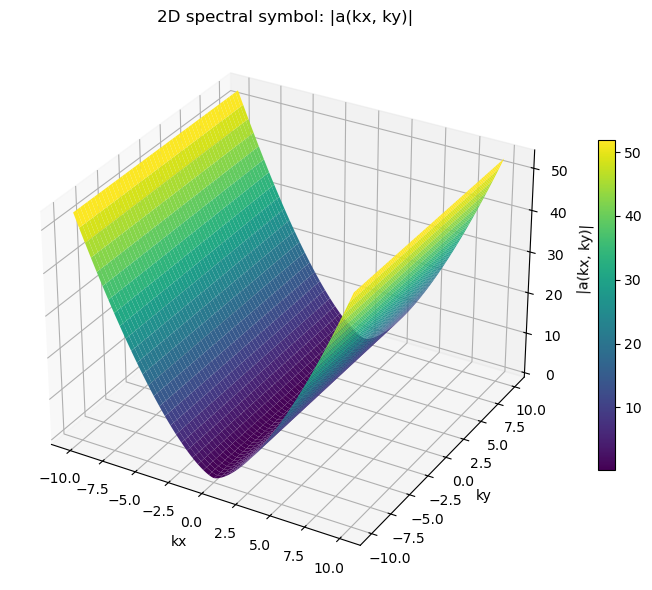


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 2.452e-02


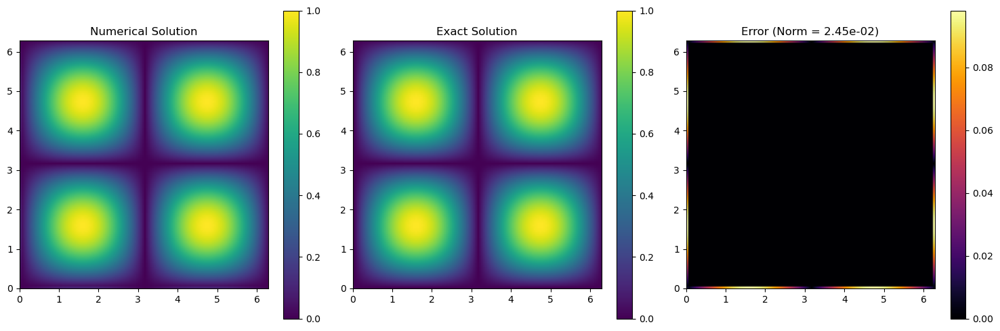

Closest available time to t_eval=0.25: 0.25
Test error t = 0.25: 2.175e-02


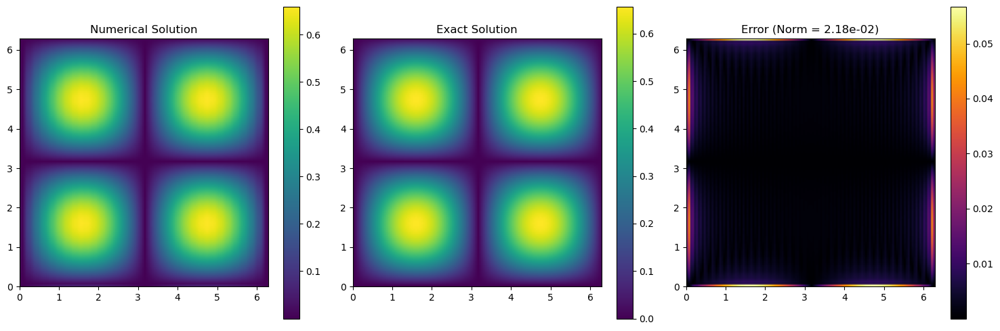

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 2.203e-02


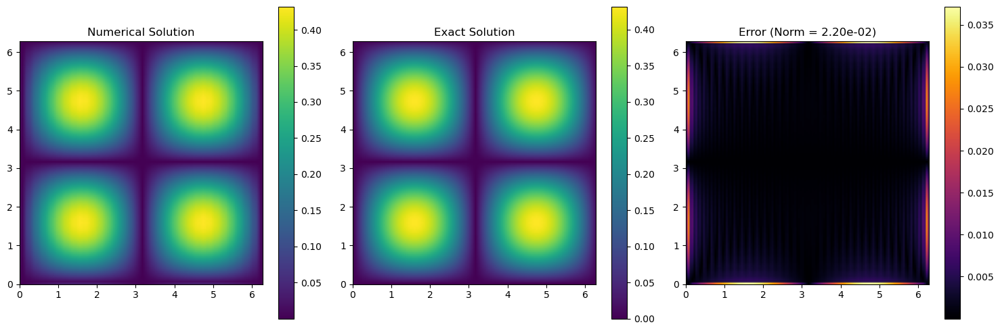

Closest available time to t_eval=0.75: 0.75
Test error t = 0.75: 2.235e-02


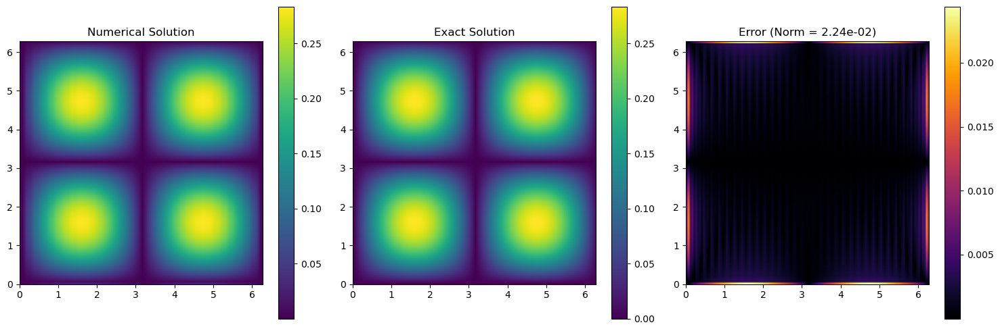

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 2.274e-02


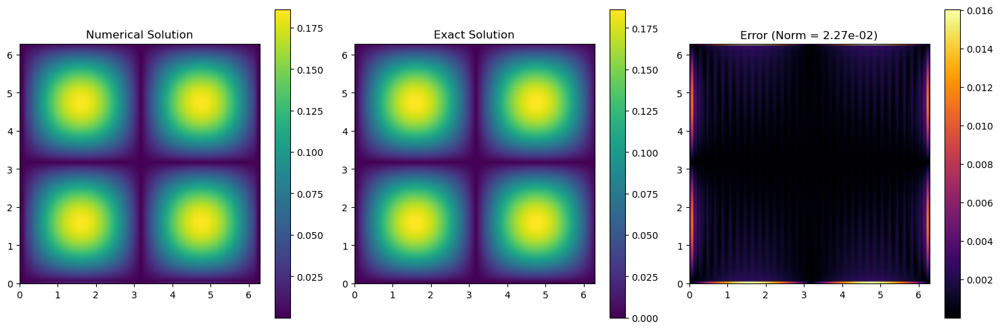

In [9]:
# Define the symbols and the equation
t, x, y, kx, ky, omega = symbols('t x y kx ky omega')
u_func = Function('u') 
u = u_func(t, x, y)

# Parameters
alpha = 1.5  # Fractional order
nu = 0.01    # Classical diffusion coefficient

# 2D fractional diffusion equation
eq = Eq(diff(u, t), -Op((kx**2 + ky**2)**(alpha/2), u))

# Create the solver
solver = PDESolver(eq, dealiasing_ratio=0.5)

# Domain and initial condition setup
Lx, Ly = 2 * np.pi, 2 * np.pi  # Domain size
Nx, Ny = 128, 128             # Grid resolution
Lt = 1.0                      # Total simulation time
Nt = 100                     # Number of time steps

# Initial condition: sinusoidal wave in 2D
initial_condition = lambda x, y: np.sin(x) * np.sin(y)

# Setup the solver
solver.setup(
    Lx=Lx, Ly=Ly, Nx=Nx, Ny=Ny, Lt=Lt, Nt=Nt,
    initial_condition=initial_condition
)

# Solve the equation
solver.solve()

# Exact solution function at t = 1
def u_exact(x, y, t):
    return np.sin(x) * np.sin(y) * np.exp(-t * (1**2 + 1**2)**(alpha/2))

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5e-2, component='real') for i in range(n_test + 1)]

## 2D wave equation


*********************************
* Partial differential equation *
*********************************

 2                 2                 2             
∂                 ∂                 ∂              
───(u(t, x, y)) = ───(u(t, x, y)) + ───(u(t, x, y))
  2                 2                 2            
∂t                ∂x                ∂y             

********************
* Equation parsing *
********************


Equation rewritten in standard form: Derivative(u(t, x, y), (t, 2)) - Derivative(u(t, x, y), (x, 2)) - Derivative(u(t, x, y), (y, 2))

Expanded equation: Derivative(u(t, x, y), (t, 2)) - Derivative(u(t, x, y), (x, 2)) - Derivative(u(t, x, y), (y, 2))
Analyzing term: Derivative(u(t, x, y), (t, 2))
  Derivative found: Derivative(u(t, x, y), (t, 2))
  --> Classified as linear
Analyzing term: -Derivative(u(t, x, y), (x, 2))
  Derivative found: Derivative(u(t, x, y), (x, 2))
  --> Classified as linear
Analyzing term: -Derivative(u(t, x, y), (y, 2))
  Derivative found: 

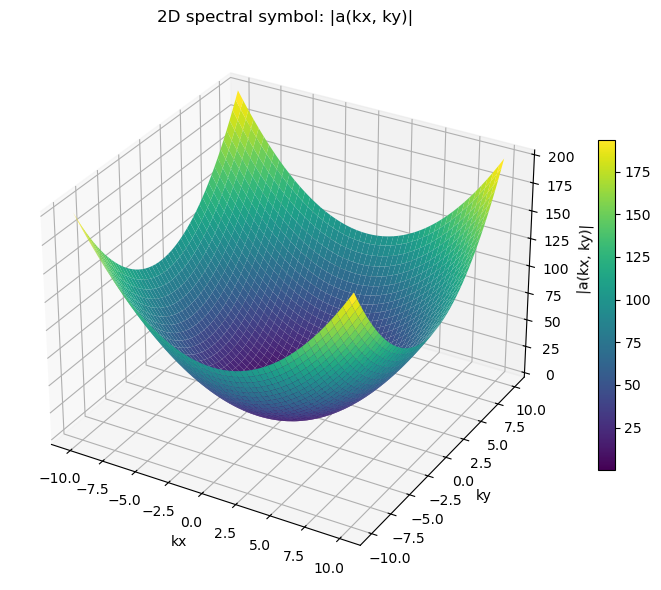


*****************************
* Wave propagation analysis *
*****************************



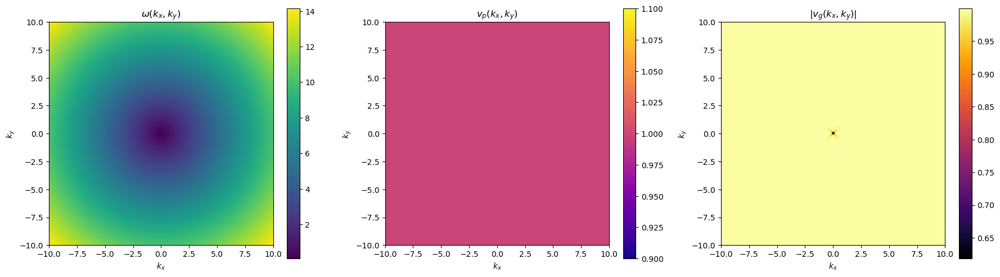


*******************
* Solving the PDE *
*******************



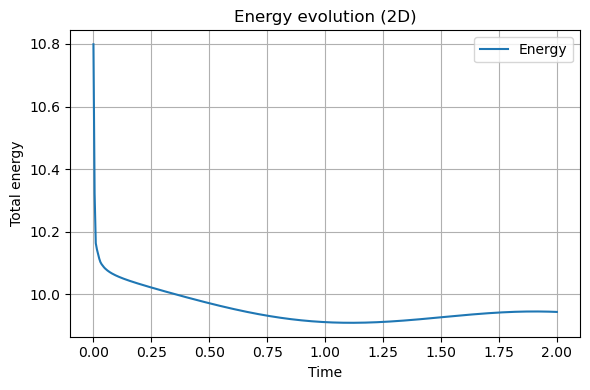

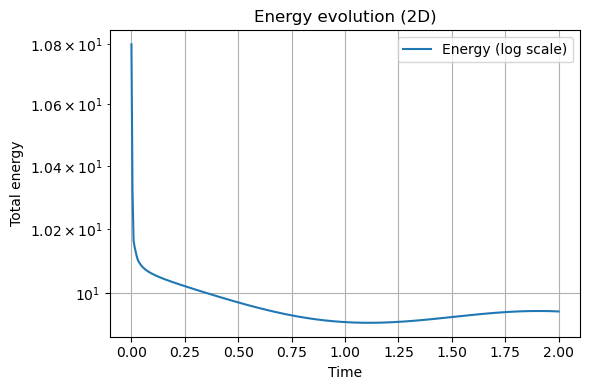

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 2.169e-03


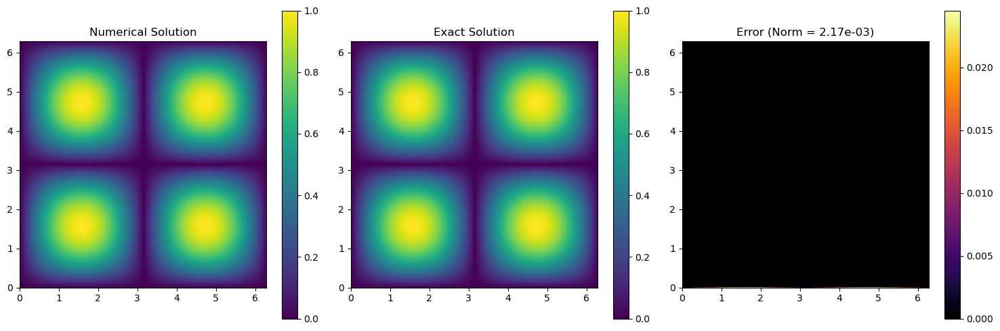

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 1.741e-02


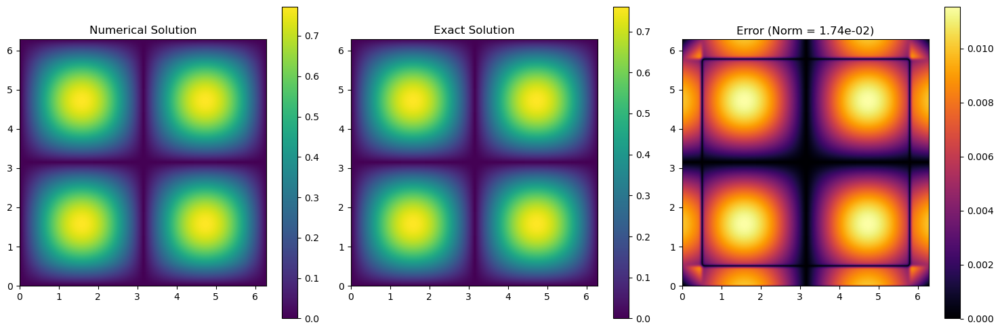

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 9.994e-02


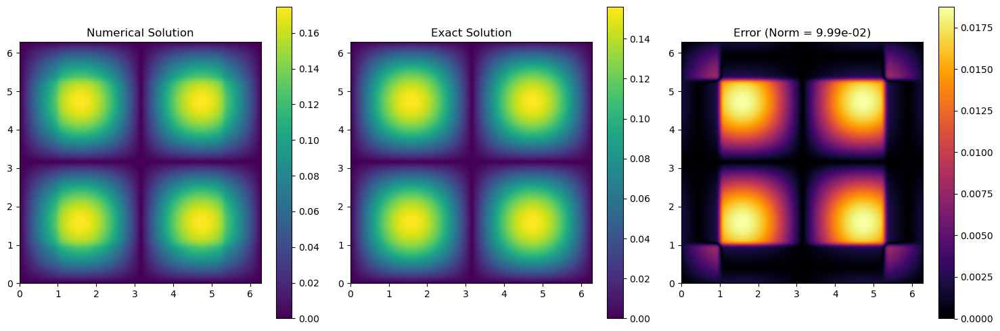

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 2.534e-02


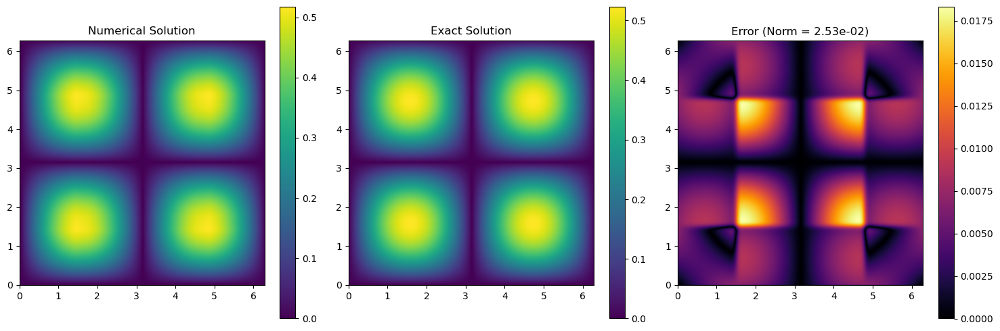

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.466e-02


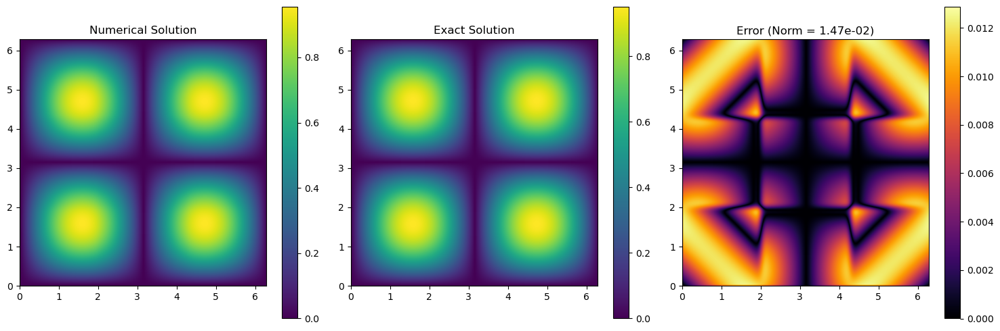

In [10]:
# Define the symbols and the unknown function
t, x, y, kx, ky, omega = symbols('t x y kx ky omega')
u_func = Function('u') 
u = u_func(t, x, y)

# 2D wave equation
eq = Eq(diff(u, t, t), diff(u, x, x) + diff(u, y, y))

# Initialize the solver
solver = PDESolver(eq, time_scheme='ETD-RK4')

# Parameters
Lx = Ly = 2 * np.pi
Nx = Ny = 512
Lt = 2.0
Nt = 400

# Configure the solver with the problem parameters
solver.setup(
    Lx=Lx, Ly=Ly, Nx=Nx, Ny=Ny, Lt=Lt, Nt=Nt,
    initial_condition=lambda x, y: np.sin(x) * np.sin(y),
    initial_velocity=lambda x, y: np.zeros_like(x),
)

# Solve the equation
solver.solve()

solver.plot_energy()
solver.plot_energy(log=True) 

# Exact solution: sin(x) sin(y) cos(ωt), with ω = sqrt(2)
def u_exact(x, y, t):
    """
    Analytical solution of the 2D wave equation.
    The solution is given by u(x, y, t) = sin(x) * sin(y) * cos(ωt),
    where ω = sqrt(kx^2 + ky^2) = sqrt(1^2 + 1^2).
    """
    omega = np.sqrt(1**2 + 1**2)
    return np.sin(x) * np.sin(y) * np.cos(omega * t)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=5, component='abs') for i in range(n_test + 1)]


## 2D wave equation with a source term


*********************************
* Partial differential equation *
*********************************

 2                                                                             ↪
∂                                                                            ∂ ↪
───(u(t, x, y)) = (-√3⋅sin(√3⋅t) + 5⋅cos(√3⋅t))⋅cos(x)⋅cos(y) - u(t, x, y) + ─ ↪
  2                                                                            ↪
∂t                                                                           ∂ ↪

↪ 2                 2             
↪                  ∂              
↪ ──(u(t, x, y)) + ───(u(t, x, y))
↪  2                 2            
↪ x                ∂y             

********************
* Equation parsing *
********************


Equation rewritten in standard form: -(-sqrt(3)*sin(sqrt(3)*t) + 5*cos(sqrt(3)*t))*cos(x)*cos(y) + u(t, x, y) + Derivative(u(t, x, y), (t, 2)) - Derivative(u(t, x, y), (x, 2)) - Derivative(u(t, x, y), (y, 2))

Expanded equation: u(t, x, y) + sqrt(3)

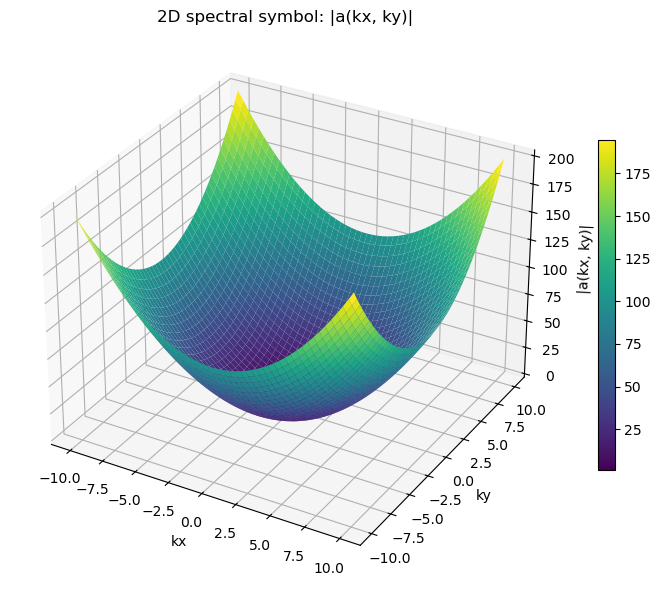


*****************************
* Wave propagation analysis *
*****************************



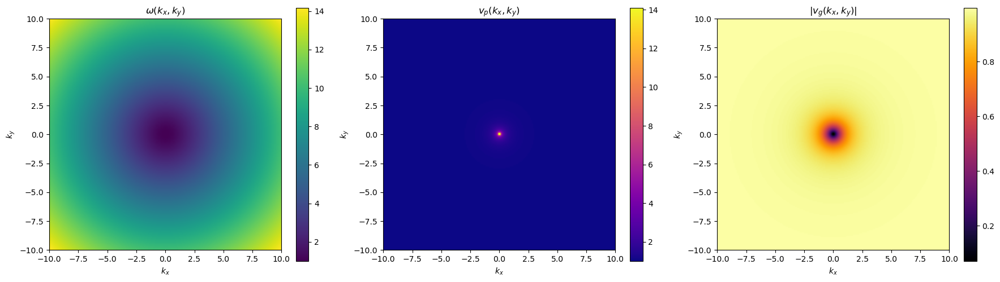


*******************
* Solving the PDE *
*******************



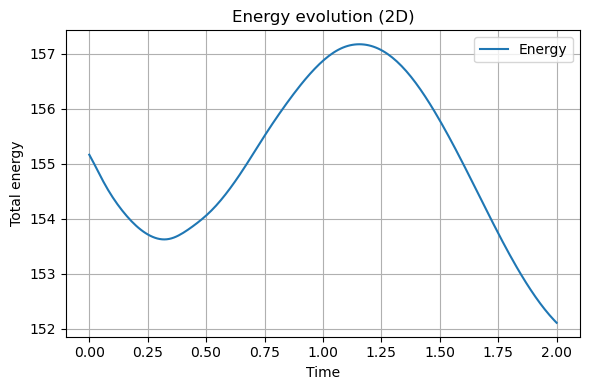

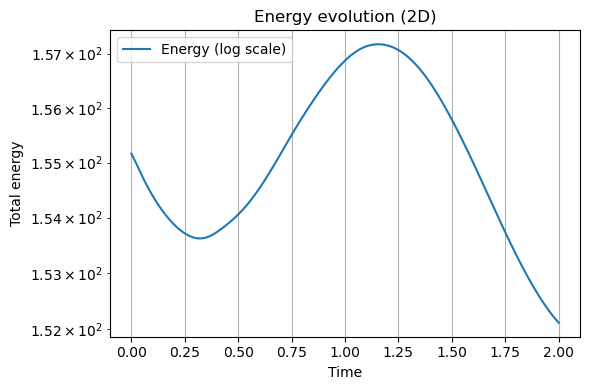

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 2.204e-02


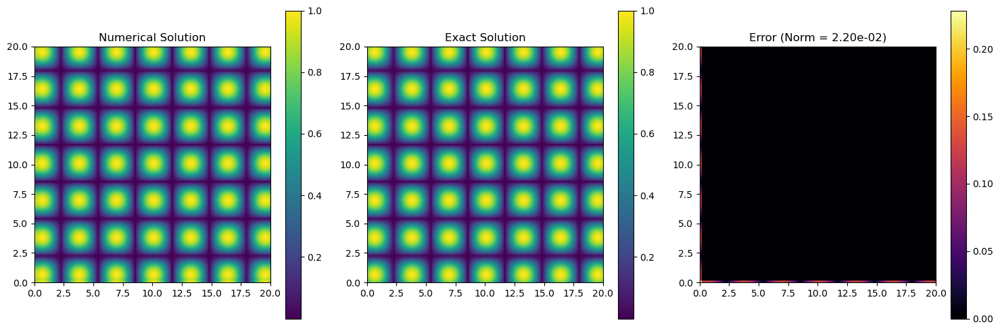

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 1.098e-01


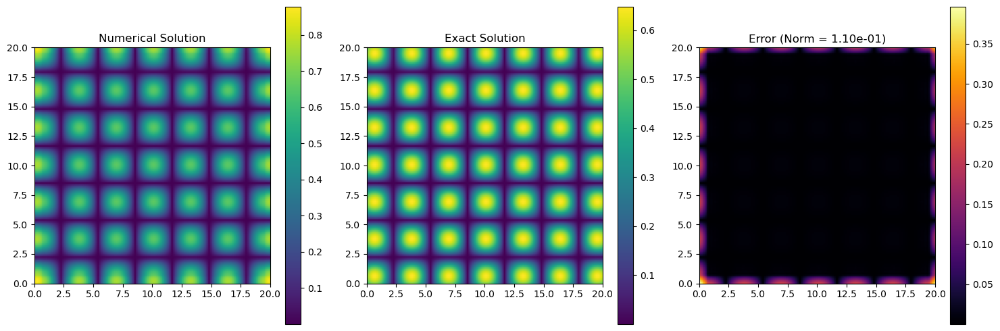

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 6.931e-01


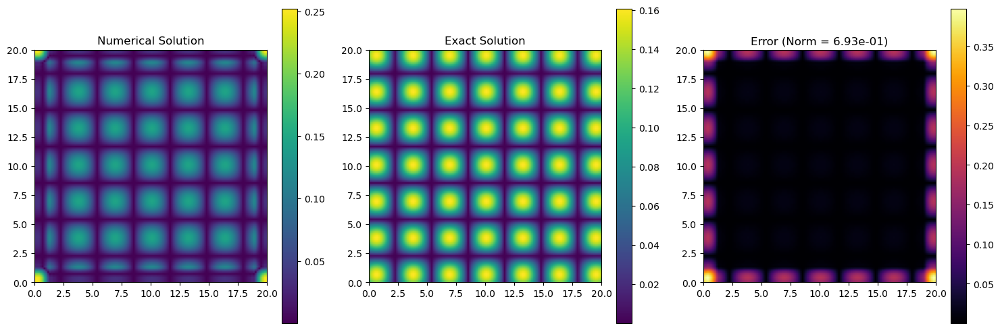

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 1.080e-01


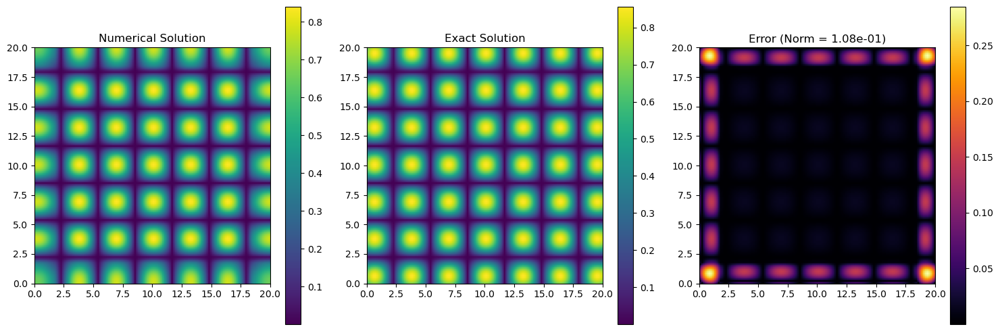

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.210e-01


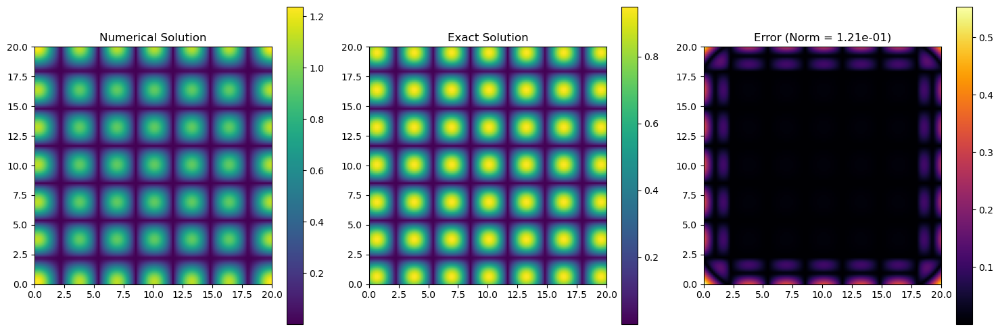

In [11]:
from sympy import symbols, Eq, Function, sqrt, cos, sin

# Define the symbols and the wave equation with a source term
t, x, y, omega = symbols('t x y omega')
u_func = Function('u')
u = u_func(t, x, y)

# Source term
source_term = cos(x) * cos(y) * (5 * cos(sqrt(3) * t) - sqrt(3) * sin(sqrt(3) * t))

# Equation with source term
eq = Eq(diff(u, t, t), diff(u, x, x) + diff(u, y, y) - u + source_term)

# Create the solver with ETD-RK4 scheme
solver = PDESolver(eq, time_scheme='ETD-RK4', dealiasing_ratio=2/3)

# Simulation parameters
Lt = 2.0  # Total simulation time
Lx, Ly = 20, 20  # Spatial domain size
Nx, Ny = 128, 128  # Number of grid points
Nt = 200  # Number of time steps

# Initial conditions
initial_condition = lambda x, y: np.cos(x) * np.cos(y)
initial_velocity = lambda x, y: np.zeros_like(x)

# Setup the solver
solver.setup(
    Lx=Lx, Ly=Ly, Nx=Nx, Ny=Ny, Lt=Lt, Nt=Nt,
    initial_condition=initial_condition,
    initial_velocity=initial_velocity
)

# Solve the equation
solver.solve()

# Plot energy evolution
solver.plot_energy()
solver.plot_energy(log=True)

# Exact solution at any time t
def u_exact(x, y, t):
    return np.cos(x) * np.cos(y) * np.cos(np.sqrt(3) * t)

# Automatic testing at multiple times
n_test = 4
test_set = [
    solver.test(
        u_exact=u_exact,
        t_eval=i * Lt / n_test,
        threshold=5,  # Adjust threshold if necessary
        component='real'
    )
    for i in range(n_test + 1)
]


## 2D wave equation with psiOp


*********************************
* Partial differential equation *
*********************************

 2                                            
∂                      ⎛   2    2            ⎞
───(u(t, x, y)) = psiOp⎝- η  - ξ , u(t, x, y)⎠
  2                                           
∂t                                            

********************
* Equation parsing *
********************


Equation rewritten in standard form: -psiOp(-eta**2 - xi**2, u(t, x, y)) + Derivative(u(t, x, y), (t, 2))
⚠️ psiOp detected: skipping expansion for safety

Expanded equation: -psiOp(-eta**2 - xi**2, u(t, x, y)) + Derivative(u(t, x, y), (t, 2))
Analyzing term: -psiOp(-eta**2 - xi**2, u(t, x, y))
  --> Classified as pseudo linear term (psiOp)
Analyzing term: Derivative(u(t, x, y), (t, 2))
  Derivative found: Derivative(u(t, x, y), (t, 2))
  --> Classified as linear
Final linear terms: {Derivative(u(t, x, y), (t, 2)): 1}
Final nonlinear terms: []
Symbol terms: []
Pseudo terms: [(-1, -eta**2 

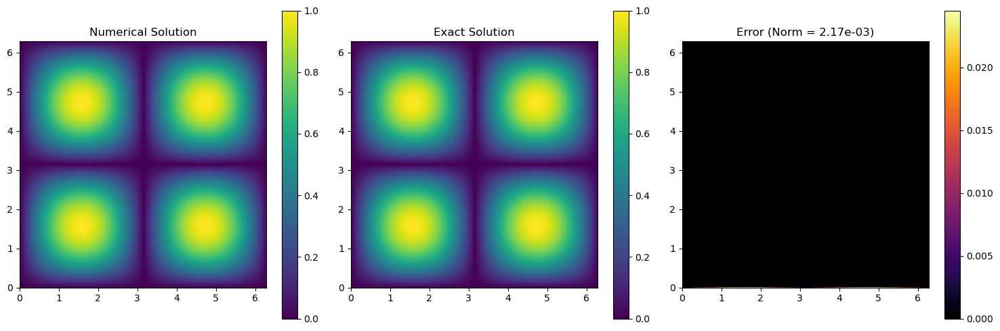

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 2.141e-02


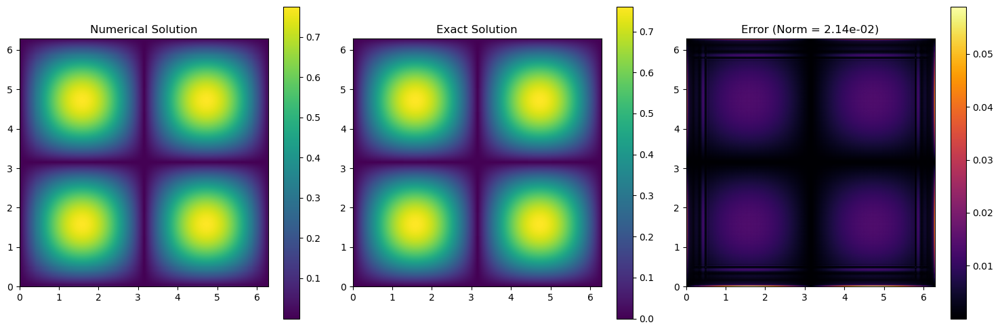

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 1.356e-01


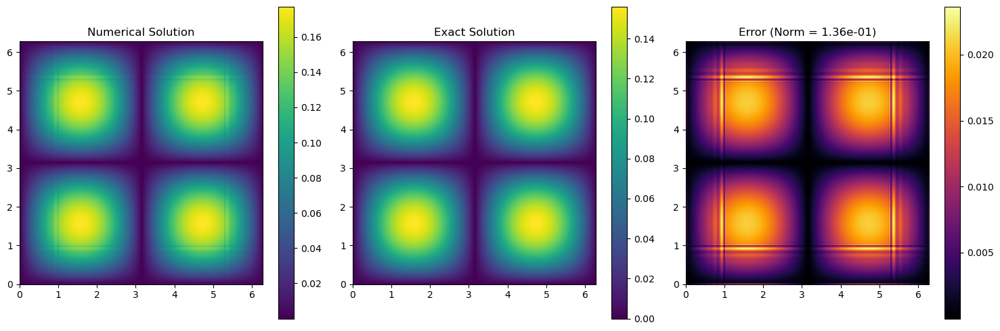

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 3.670e-02


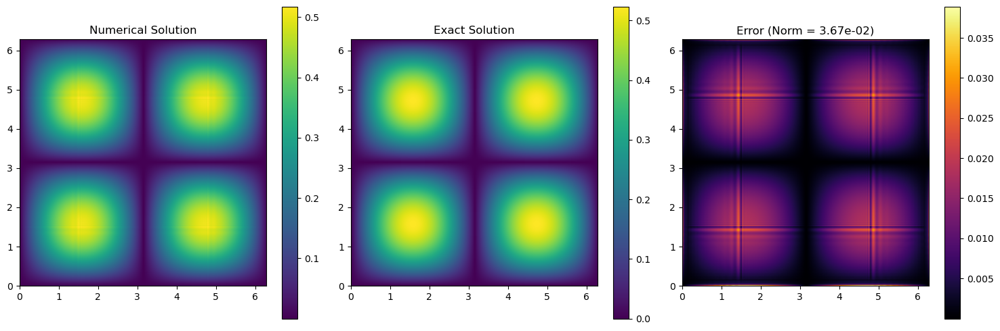

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.339e-02


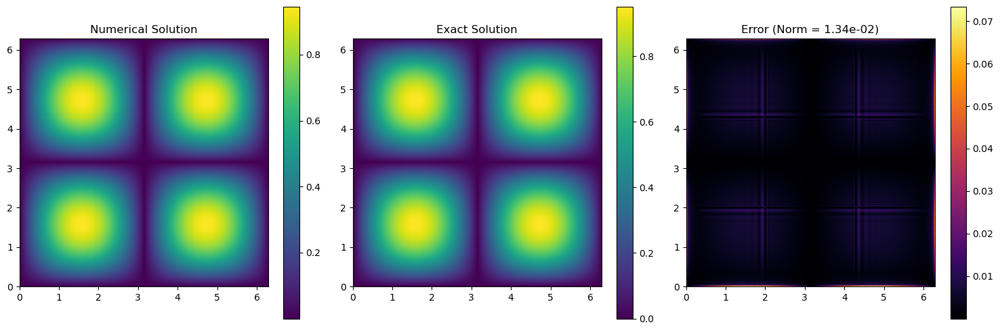

In [12]:
# Define the symbols and the unknown function
t, x, y, xi, eta = symbols('t x y xi eta', real=True)
u_func = Function('u') 
u = u_func(t, x, y)

# 2D wave equation
eq = Eq(diff(u, t, t), psiOp(-(xi**2 + eta**2), u))

# Initialize the solver
solver = PDESolver(eq)

# Parameters
Lx = Ly = 2 * np.pi
Nx = Ny = 512
Lt = 2.0
Nt = 400

# Configure the solver with the problem parameters
solver.setup(
    Lx=Lx, Ly=Ly, Nx=Nx, Ny=Ny, Lt=Lt, Nt=Nt,
    initial_condition=lambda x, y: np.sin(x) * np.sin(y),
    initial_velocity=lambda x, y: np.zeros_like(x),
)

# Solve the equation
solver.solve()

solver.plot_energy()
solver.plot_energy(log=True) 

# Exact solution: sin(x) sin(y) cos(ωt), with ω = sqrt(2)
def u_exact(x, y, t):
    """
    Analytical solution of the 2D wave equation.
    The solution is given by u(x, y, t) = sin(x) * sin(y) * cos(ωt),
    where ω = sqrt(kx^2 + ky^2) = sqrt(1^2 + 1^2).
    """
    omega = np.sqrt(1**2 + 1**2)
    return np.sin(x) * np.sin(y) * np.cos(omega * t)

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=0.2, component='abs') for i in range(n_test + 1)]


## 2D Klein-Gordon equation


*********************************
* Partial differential equation *
*********************************

 2                                       2                     2             
∂                                       ∂                     ∂              
───(u(t, x, y)) = -1.0⋅u(t, x, y) + 1.0⋅───(u(t, x, y)) + 1.0⋅───(u(t, x, y))
  2                                       2                     2            
∂t                                      ∂x                    ∂y             

********************
* Equation parsing *
********************


Equation rewritten in standard form: 1.0*u(t, x, y) + Derivative(u(t, x, y), (t, 2)) - 1.0*Derivative(u(t, x, y), (x, 2)) - 1.0*Derivative(u(t, x, y), (y, 2))

Expanded equation: 1.0*u(t, x, y) + Derivative(u(t, x, y), (t, 2)) - 1.0*Derivative(u(t, x, y), (x, 2)) - 1.0*Derivative(u(t, x, y), (y, 2))
Analyzing term: 1.0*u(t, x, y)
  --> Classified as linear
Analyzing term: Derivative(u(t, x, y), (t, 2))
  Derivative found: Derivative(u(t

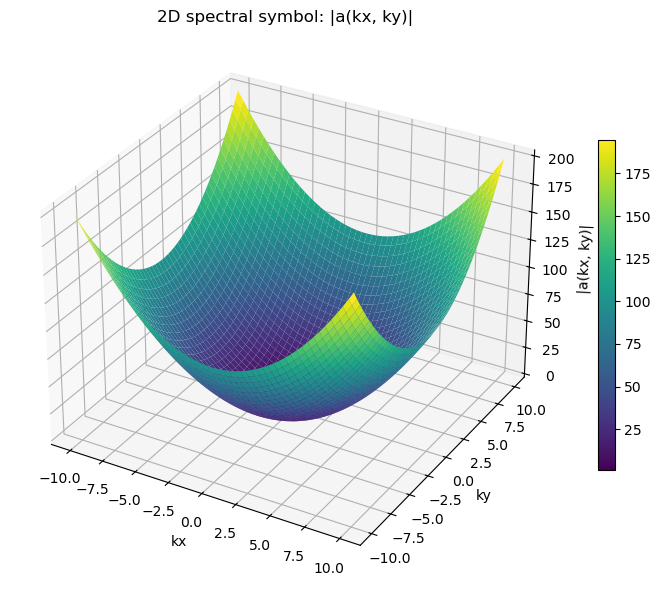


*****************************
* Wave propagation analysis *
*****************************



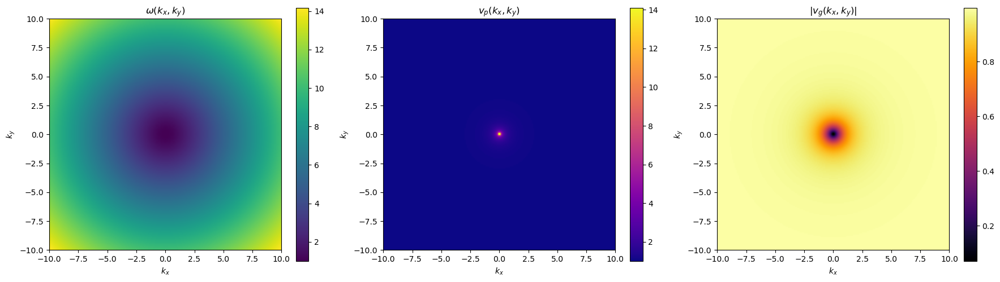


*******************
* Solving the PDE *
*******************



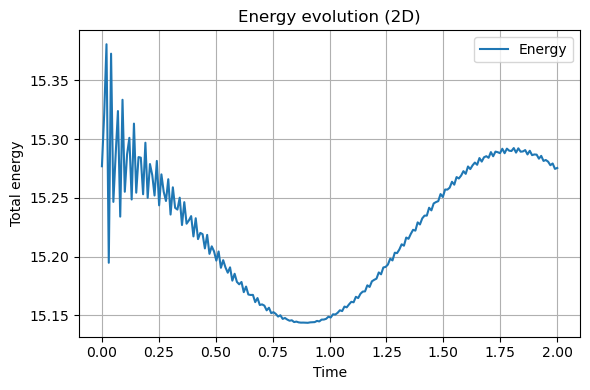

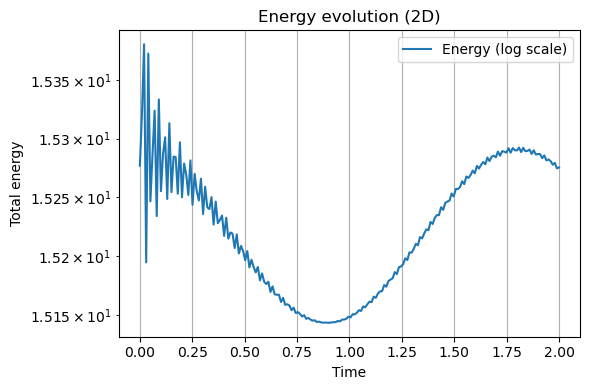

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 3.068e-03


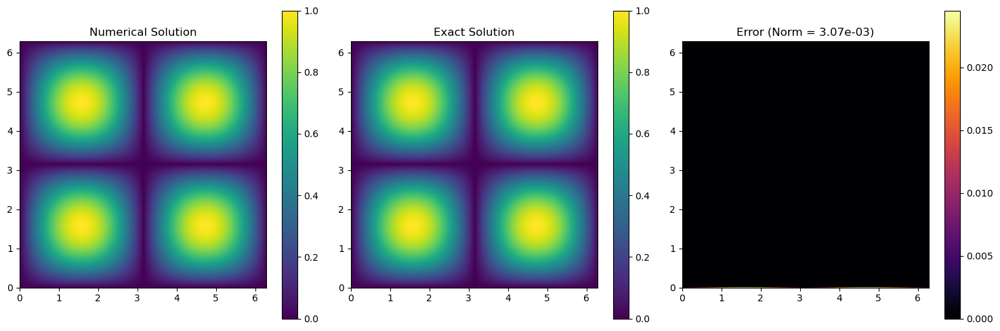

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 2.144e-02


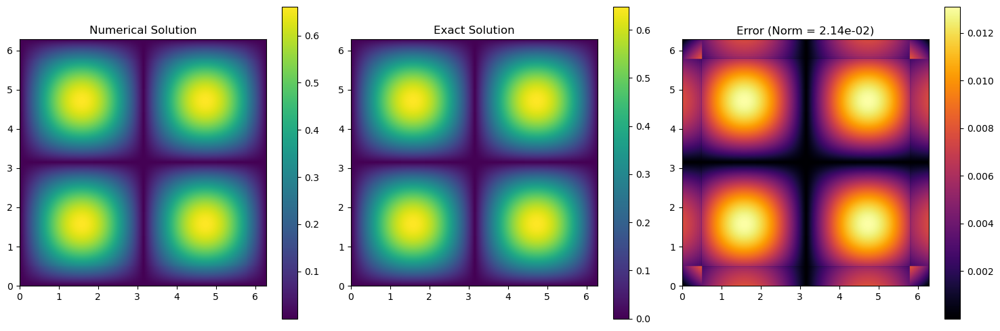

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 9.016e-02


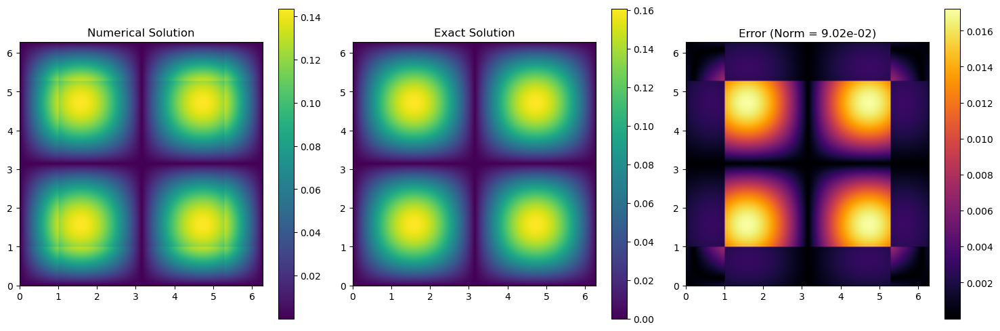

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 1.206e-02


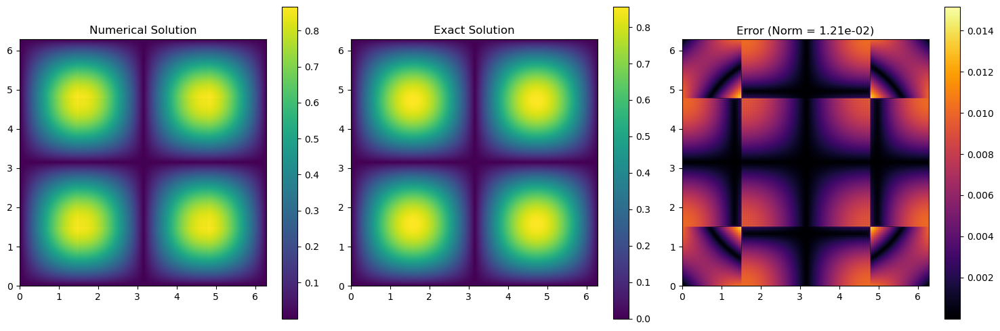

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 1.349e-02


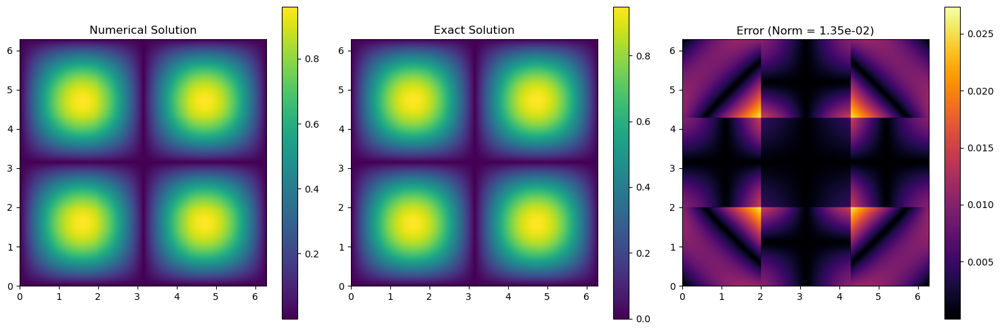

In [13]:
# Physical parameters
c = 1.0  # Wave speed
m = 1.0  # Field mass

# Definition of the 2D Klein-Gordon equation
t, x, y, kx, ky, omega = symbols('t x y kx ky omega')
u_func = Function('u') 
u = u_func(t, x, y)

klein_gordon_eq = Eq(diff(u, t, t), c**2*(diff(u, x, x) + diff(u, y, y)) - m**2*u)

# Creation of the solver 
solver = PDESolver(klein_gordon_eq)

# Domain configuration
L = 2 * np.pi  # Square domain [0, 2π] × [0, 2π]
N = 512        # Grid points per dimension
T_final = 2.0  # Final time
Nt = 200       # Time steps

# Initial conditions
kx = 1
ky = 1
omega = np.sqrt(c**2*(kx**2 + ky**2) + m**2)  # Direct numerical calculation

solver.setup(
    Lx=L, Ly=L,
    Nx=N, Ny=N,
    Lt=T_final, Nt=Nt,
    initial_condition=lambda x, y: np.sin(x) * np.sin(y),
    initial_velocity=lambda x, y: np.zeros_like(x)  # Initial time derivative is zero
)

# Replace the definition of the exact solution with:
omega_val = float(np.sqrt(c**2*(kx**2 + ky**2) + m**2))  # Convert to float

def u_exact(x, y, t):
    return np.sin(x) * np.sin(y) * np.cos(omega_val * t)

# Solving and validation
solver.solve()

solver.plot_energy()
solver.plot_energy(log=True) 

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=1e-1, component='real') for i in range(n_test + 1)]

## 2D biharmonic equation


*********************************
* Partial differential equation *
*********************************

                    4                 4                     4               
∂                  ∂                 ∂                     ∂                
──(u(t, x, y)) = - ───(u(t, x, y)) - ───(u(t, x, y)) - 2⋅───────(u(t, x, y))
∂t                   4                 4                   2   2            
                   ∂x                ∂y                  ∂y  ∂x             

********************
* Equation parsing *
********************


Equation rewritten in standard form: Derivative(u(t, x, y), t) + Derivative(u(t, x, y), (x, 4)) + Derivative(u(t, x, y), (y, 4)) + 2*Derivative(u(t, x, y), (x, 2), (y, 2))

Expanded equation: Derivative(u(t, x, y), t) + Derivative(u(t, x, y), (x, 4)) + Derivative(u(t, x, y), (y, 4)) + 2*Derivative(u(t, x, y), (x, 2), (y, 2))
Analyzing term: Derivative(u(t, x, y), t)
  Derivative found: Derivative(u(t, x, y), t)
  --> Classified as linear
Ana

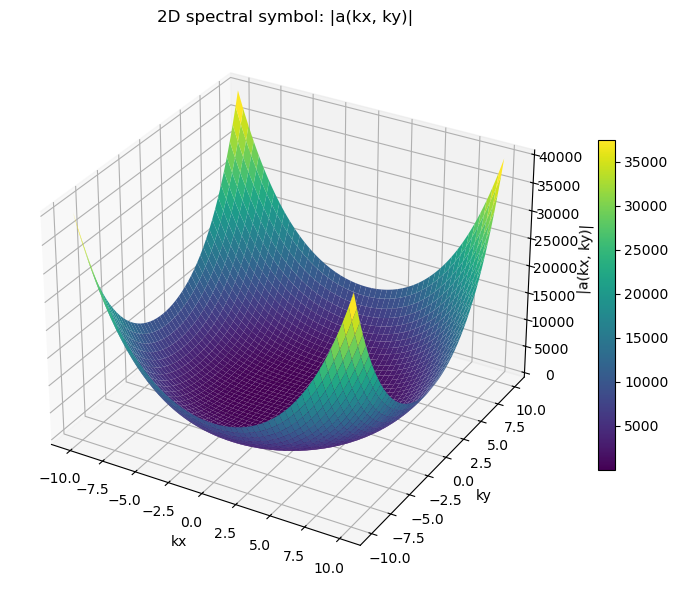


*******************
* Solving the PDE *
*******************

Closest available time to t_eval=0.0: 0.0
Test error t = 0.0: 3.068e-03


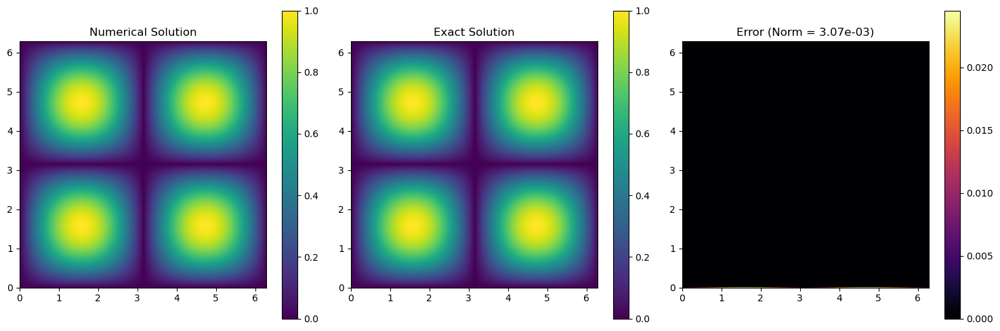

Closest available time to t_eval=0.5: 0.5
Test error t = 0.5: 6.168e-02


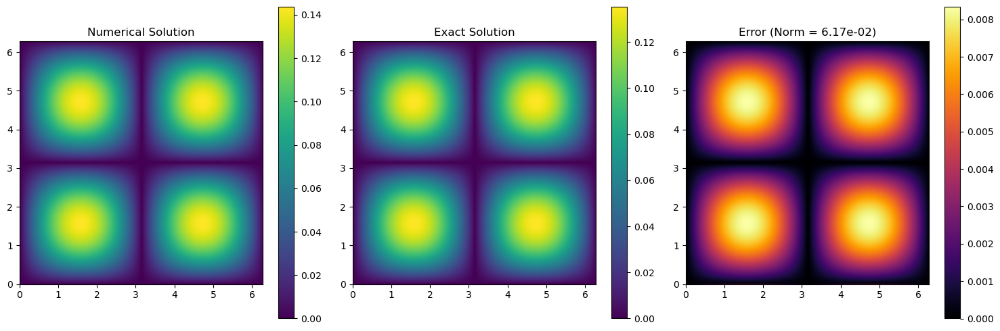

Closest available time to t_eval=1.0: 1.0
Test error t = 1.0: 6.143e-02


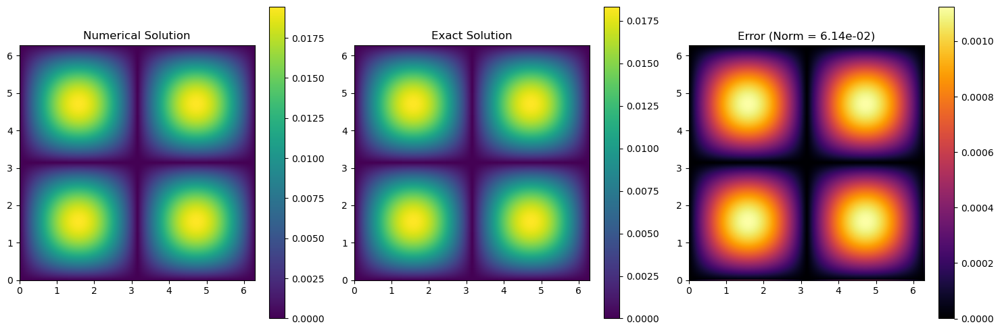

Closest available time to t_eval=1.5: 1.5
Test error t = 1.5: 6.118e-02


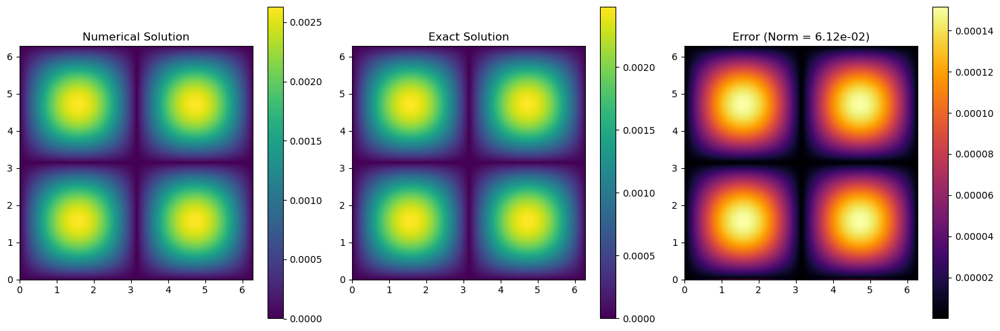

Closest available time to t_eval=2.0: 2.0
Test error t = 2.0: 6.093e-02


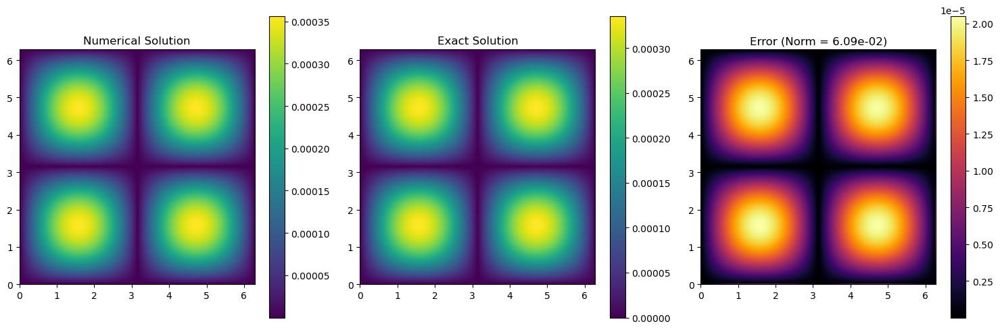

In [14]:
# Definition of the 2D biharmonic equation
t, x, y, kx, ky, omega = symbols('t x y kx ky omega')
u_func = Function('u') 
u = u_func(t, x, y)

biharmonic_eq = Eq(diff(u, t), -(diff(u, x, 4) + 2*diff(u, x, 2, y, 2) + diff(u, y, 4)))

# Creation of the solver with periodic boundary conditions
solver = PDESolver(biharmonic_eq)

# Configuration of the domain
L = 2 * np.pi  # Square domain [0, 2π] × [0, 2π]
N = 512         # Grid points per dimension
Lt = 2.0  # Final time
Nt = 400       # Time steps

# Initial sinusoidal 2D condition
initial_condition = lambda x, y: np.sin(x) * np.sin(y)

solver.setup(
    Lx=L, Ly=L,
    Nx=N, Ny=N,
    Lt=Lt, Nt=Nt,
    initial_condition=initial_condition
)

# Corresponding exact solution
def u_exact(x, y, t):
    return np.sin(x) * np.sin(y) * np.exp(-4*t)

# Solving 
solver.solve()

# Automatic testing
n_test = 4
test_set = [solver.test(u_exact=u_exact, t_eval=i * Lt / n_test, threshold=7e-2, component='real') for i in range(n_test + 1)]